## Eurofab model training

In [1]:
import glob

import geopandas as gpd
import matplotlib.pyplot as plt
import numba
import numpy as np
import pandas as pd
from libpysal.graph import read_parquet
from sklearn.preprocessing import PowerTransformer, RobustScaler, StandardScaler
from sklearn.ensemble import RandomForestClassifier
from core.utils import used_keys

from palettable.colorbrewer.qualitative import Set3_12
from sklearn.metrics import davies_bouldin_score, f1_score

from sklearn.model_selection import GridSearchCV
from sklearn.calibration import CalibratedClassifierCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_moons
from sklearn import model_selection
from sklearn.metrics import accuracy_score, balanced_accuracy_score, make_scorer

from core.generate_predictions import read_train_test, get_cluster_names, get_level_cut

In [2]:
v = 'v10'

sample_size = 600_000

mapping_level = 4

train_test_iteration = 7

Generate the train test data for the specified iteration and train the model

In [3]:
%%time
X_resampled, y_resampled = read_train_test(train_test_iteration, mapping_level, sample_size)



if 'source' in X_resampled.columns:
    categorical_features = ['source']
else:
    categorical_features = None


from sklearn.ensemble import HistGradientBoostingClassifier

model = HistGradientBoostingClassifier(random_state=123, verbose=1,
                                            learning_rate = 0.03,
                                           categorical_features=categorical_features,
                                            # max_depth = None, 
                                            max_iter = 120, 
                                            # max_leaf_nodes=None,
                                            # max_features=.5
                                           )
model.fit(X_resampled, y_resampled)
print(model.score(X_resampled, y_resampled))

final_without_noise
7    600000
8    600000
3    600000
5    600000
6    600000
1    600000
4    600000
2    600000
Name: count, dtype: int64
Binning 2.523 GB of training data: 1.243 s
Binning 0.280 GB of validation data: 0.119 s
Fitting gradient boosted rounds:
[1/120] 8 trees, 248 leaves (31 on avg), max depth = 10, train loss: 2.00525, val loss: 2.00530, in 2.245s
[2/120] 8 trees, 248 leaves (31 on avg), max depth = 11, train loss: 1.94178, val loss: 1.94188, in 2.273s
[3/120] 8 trees, 248 leaves (31 on avg), max depth = 12, train loss: 1.88583, val loss: 1.88602, in 2.307s
[4/120] 8 trees, 248 leaves (31 on avg), max depth = 11, train loss: 1.83601, val loss: 1.83628, in 2.351s
[5/120] 8 trees, 248 leaves (31 on avg), max depth = 12, train loss: 1.79088, val loss: 1.79120, in 2.337s
[6/120] 8 trees, 248 leaves (31 on avg), max depth = 10, train loss: 1.75004, val loss: 1.75041, in 2.317s
[7/120] 8 trees, 248 leaves (31 on avg), max depth = 11, train loss: 1.71261, val loss: 1.71302

Store the model to disk

In [58]:
%%time
from pickle import dump
with open(f"../data/model_{mapping_level}_{train_test_iteration}_{v}.pkl", "wb") as f:
    dump(model, f, protocol=5)

CPU times: user 8.43 ms, sys: 1.03 ms, total: 9.46 ms
Wall time: 8.66 ms


Read the test data and measure the model performance

In [5]:
coredir = '/data/uscuni-eurofab-overture/'

In [6]:
level_cut = get_level_cut(mapping_level)
X_test = pd.read_parquet(f'{coredir}processed_data/train_test_data/testing_data{train_test_iteration}.pq')
y_test = pd.read_parquet(f'{coredir}processed_data/train_test_data/testing_labels{train_test_iteration}.pq')
y_test['final_without_noise'] = y_test['final_without_noise'].map(level_cut.to_dict())

cluster_names = get_cluster_names(mapping_level)

assert y_test.final_without_noise.isna().sum() == 0
assert (X_test.index == y_test.index).all()

print(y_test.final_without_noise.map(cluster_names).value_counts())

if 'source' in X_resampled.columns:
    categorical_features = ['source']
else:
    categorical_features = None

## predictions
predictions = model.predict(X_test)

weighted = f1_score(y_test, predictions, average='weighted')
micro = f1_score(y_test, predictions, average='micro')
macro = f1_score(y_test, predictions, average='macro')
overall_acc = pd.Series([weighted, micro, macro], index=['Weighted F1', 'Micro F1', 'Macro F1'])

f1s_vals = f1_score(y_test, predictions, average=None)
f1s = pd.Series(
    f1s_vals,
    index = [cluster_names[k] for k in sorted(np.unique(predictions))]
)
f1s = f1s.sort_values()

final_without_noise
Dense Standalone Buildings        5119285
Aligned Winding Streets           2102574
Open Layout                       2057918
Linear Developments               1241755
Dense Adjacent Buildings          1084104
Wide-space Developments            578704
Large Utilitarian Developments     360140
Large Interconnected Blocks        265475
Name: count, dtype: int64


In [7]:
overall_acc

Weighted F1    0.587272
Micro F1       0.573691
Macro F1       0.533198
dtype: float64

In [8]:
f1s.sort_index()

Aligned Winding Streets           0.463781
Dense Adjacent Buildings          0.444170
Dense Standalone Buildings        0.665487
Large Interconnected Blocks       0.632730
Large Utilitarian Developments    0.354932
Linear Developments               0.739707
Open Layout                       0.599508
Wide-space Developments           0.365266
dtype: float64

In [16]:
cluster_names.values()

dict_values(['Wide-space Developments', 'Large Utilitarian Developments', 'Linear Developments', 'Open Layout', 'Aligned Winding Streets', 'Large Interconnected Blocks', 'Dense Standalone Buildings', 'Dense Adjacent Buildings'])

Generate a confusion matrix.

In [9]:
from sklearn.metrics import ConfusionMatrixDisplay 
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

In [21]:
labels = ['Wide-space Developments', 'Large Utilitarian Developments', 'Linear Developments', 'Open Layout', 'Aligned Winding Streets', 'Dense Standalone Buildings', 'Dense Adjacent Buildings', 'Large Interconnected Blocks',]

In [22]:
cm = confusion_matrix(y_test.final_without_noise.map(cluster_names), 
                      pd.Series(predictions).map(cluster_names), 
                      labels=labels,
                      normalize='true'
                     )

In [23]:
disp = ConfusionMatrixDisplay(confusion_matrix=np.round(cm, decimals=2), 
                              display_labels=labels
                             )

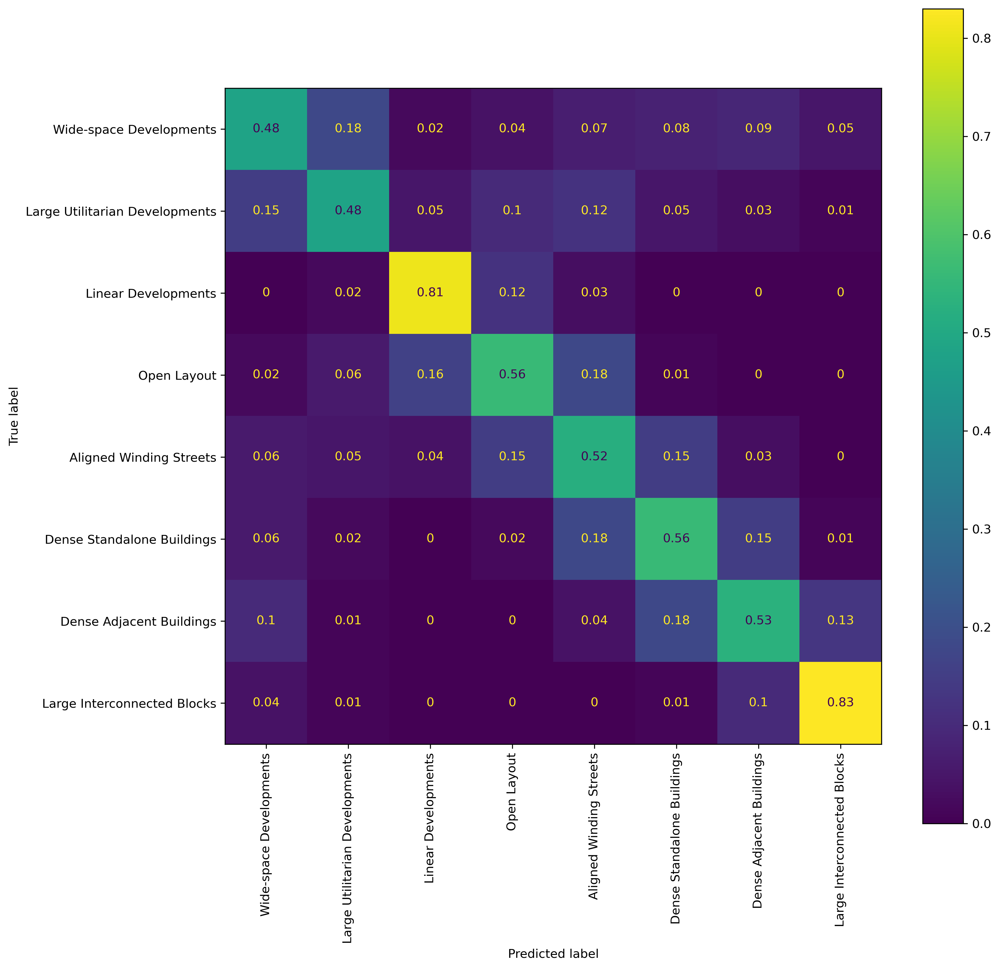

In [24]:
fig,ax = plt.subplots(figsize=(12,12), dpi=300)
disp.plot( xticks_rotation = 'vertical', ax=ax)

## Plot predictions

In [25]:
import pandas as pd
import geopandas as gpd
import pickle
from lonboard import SolidPolygonLayer, Map
from lonboard.basemap import CartoBasemap
from lonboard.colormap import apply_categorical_cmap
from palettable.colorbrewer.qualitative import Set3_12
from core.cluster_validation import get_color
from core.utils import combine_regions_data
from core.generate_predictions import read_train_test, get_cluster_names, get_level_cut

In [26]:
# regions_datadir = "/data/uscuni-eurofab-overture/"
# region_hulls = gpd.read_parquet(
#         regions_datadir + "regions/" + "ov_ce_region_hulls.parquet"
#     )
# region_hulls.explore()

Specify model parameters.

In [27]:
coredir = '/data/uscuni-eurofab-overture/'
mapping_level = 4
train_test_iteration = 7


Read model and test data

In [28]:
# with open(f'../data/model_{mapping_level}_{train_test_iteration}.pkl', 'rb') as f:
#     model = pickle.load(f)

In [29]:
level_cut = get_level_cut(mapping_level)
y_test = pd.read_parquet(f'{coredir}processed_data/train_test_data/testing_labels{train_test_iteration}.pq')
y_test['final_without_noise'] = y_test['final_without_noise'].map(level_cut.to_dict())

cluster_names = get_cluster_names(mapping_level)


Generate predictions for specific regions.

'/data/uscuni-eurofab-overture/'

In [44]:
data_dir = coredir + 'processed_data/chars/'
target_dir='/data/uscuni-eurofab-overture/processed_data/target_clusters/'
hex_dir='/data/uscuni-eurofab-overture/processed_data/hexagons/'


def combine_regions_data(selected_regions, char_type='primary'):
    """Combine the morphometric data, target labels and hexagons from all of the 'selected_regions' into a single dataframe for model training."""
    
    all_data = []
    all_labels = []
    all_hexagons = []
    
    for trid in selected_regions:
        
        if char_type == 'weighted_lag':
            data = pd.read_parquet(f'/data/uscuni-eurofab/processed_data/chars/lag_chars_{trid}_{kernel}_{spatial_lag}_{bandwith_type}.parquet')
            data = data.astype(np.float32)
            data.index = data.index.astype(np.int32)
        elif char_type == 'unweighted_lag':
            data = pd.read_parquet(f'/data/uscuni-eurofab/processed_data/chars/lag_chars_{trid}_unweighted_{spatial_lag}.parquet')
            data = data.astype(np.float32)
            data.index = data.index.astype(np.int32)
        elif char_type == 'primary':
            data = pd.read_parquet(f'{data_dir}primary_chars_{trid}.parquet')
        elif char_type == 'only_unweighted_lag':
            data = pd.read_parquet(f'/data/uscuni-eurofab/processed_data/chars/lag_chars_{trid}_unweighted_{spatial_lag}.parquet')
            data = data.astype(np.float32)
            data.index = data.index.astype(np.int32)
            iqr = pd.DataFrame(data.loc[:, data.columns.str.contains('_85')].values - data.loc[:, data.columns.str.contains('_15')].values, 
                         index=data.index, 
                         columns=data.columns[~data.columns.str.contains('_')] + '_iqr')
            median = data.loc[:, data.columns.str.contains('_median')]
            data = pd.merge(iqr, median, left_index=True, right_index=True)
        
        elif char_type == 'primary_overture':
            # same as primary data, but add a data source column from the building parquet
            data = pd.read_parquet(f'{data_dir}primary_chars_{trid}.parquet')
            data_source = pd.read_parquet(f"{data_dir}buildings_chars_{trid}.parquet", columns=['source', 'class'])
            data['source'] = data_source['source']
        elif char_type == 'unweighted_lag_overture':
            # same as unweighted lag, but add a data source column from the building parquet and only save the median
            data = pd.read_parquet(f'/data/uscuni-eurofab-overture/processed_data/chars/lag_chars_{trid}_unweighted_{spatial_lag}.parquet')
            data = data.astype(np.float32)
            data.index = data.index.astype(np.int32)
            data_source = pd.read_parquet(f"{data_dir}buildings_chars_{trid}.parquet", columns=['source', 'class'])
            data['source'] = data_source['source']
            data = data.loc[:, ~data.columns.str.contains('_') | data.columns.str.contains('_median')]
        elif char_type == 'only_unweighted_lag_overture':
            # keep only median and iqr from the lag, no primary chars
            data = pd.read_parquet(f'/data/uscuni-eurofab-overture/processed_data/chars/lag_chars_{trid}_unweighted_{spatial_lag}.parquet')
            data = data.astype(np.float32)
            data.index = data.index.astype(np.int32)
            iqr = pd.DataFrame(data.loc[:, data.columns.str.contains('_85')].values - data.loc[:, data.columns.str.contains('_15')].values, 
                         index=data.index, 
                         columns=data.columns[~data.columns.str.contains('_')] + '_iqr')
            median = data.loc[:, data.columns.str.contains('_median')]
            data = pd.merge(iqr, median, left_index=True, right_index=True)

   

        else:
            raise Exception('Datatype does not exist')
            
        targets = pd.read_parquet(f'{target_dir}{trid}_target.pq').set_index('index')
        hexagons = pd.read_parquet(f'{hex_dir}{trid}_hexagon.pq').set_index('index')

        # drop empty tess to save some memory
        targets = targets[targets.index > -1]
    
        common_index = data.index.join(targets.index, how='inner').join(hexagons.index, how='inner')
        data = data.loc[common_index]
        targets = targets.loc[common_index]
        hexagons = hexagons.loc[common_index]
    
        # record region_id in the index
        common_index = str(trid) + '_' + common_index.astype(str)
        
        data = data.set_index(common_index)
        targets = targets.set_index(common_index)
        hexagons = hexagons.set_index(common_index)
    
        all_data.append(data)
        all_labels.append(targets)
        all_hexagons.append(hexagons)
    
    
    all_data = pd.concat(all_data)
    all_labels = pd.concat(all_labels)
    all_hexagons = pd.concat(all_hexagons)
    
    return all_data, all_labels, all_hexagons

In [45]:
def get_buildings_and_predictions(region_id):
    """ for a specific reigon, generate the data for the predictions and index the test data"""
    all_data, all_labels, _ = combine_regions_data([region_id], char_type='primary_overture')
    predicted_index = all_data.index.str.split('_').str[-1].astype(int)
    region_test_labels = all_labels.index.isin(y_test.index)
    
    
    # predict the whole region
    regional_predictions = model.predict(all_data)
    # map the original predictions and whether the test cases are accurate
    region_test_labels = y_test.index.isin(all_labels.index)
    # accurate = predictions[region_test_labels] == y_test[region_test_labels].final_without_noise
    # accurate.index = accurate.index.str.split('_').str[-1].astype(int)
    
    
    # read the building polygons and assign the new predictions
    buildings = gpd.read_parquet(f'/data/uscuni-eurofab-overture/processed_data/buildings/buildings_{region_id}.parquet')
    buildings = buildings.loc[predicted_index]
    buildings['prediction'] = regional_predictions.astype(int)
    buildings['in_testset'] = all_labels.index.isin(y_test.index)
    # buildings['accurate'] = accurate
    return buildings

In [46]:
%%time
vienna_buildings = get_buildings_and_predictions(84568)
brno_buildings = get_buildings_and_predictions(90996)
munich_buildings = get_buildings_and_predictions(36769)
wroclaw_buildings = get_buildings_and_predictions(91484)

CPU times: user 1min 14s, sys: 3.26 s, total: 1min 18s
Wall time: 23.4 s


Plot the prediction results for the four regions on one figure.

In [47]:
import shapely
import contextily as cx
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
from matplotlib import colormaps
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib.patches as mpatches


In [53]:
cmap = [to_hex(c) for c in colormaps.get_cmap('tab10').colors]

In [54]:
def plot_predictions(buildings, ax,  cmap, name=''):
    """Plot the buildings with a specifc colormap on a specifc axes."""
    
    buildings_centre = shapely.box(*shapely.Point(buildings.centroid.x.mean(), buildings.centroid.y.mean()).buffer(10_000).bounds)
    to_plot = buildings[buildings.intersects(buildings_centre)]

    for cluster in to_plot.prediction.unique():
        to_plot[to_plot.prediction == cluster].plot(ax=ax, color=cmap[cluster])
    
    ax.set_axis_off()
    ax.set_title(name)
    
    cx.add_basemap(ax, crs=buildings.crs, source=cx.providers.CartoDB.PositronNoLabels)
    ax.add_artist(ScaleBar(1, location="upper right"))

    return ax

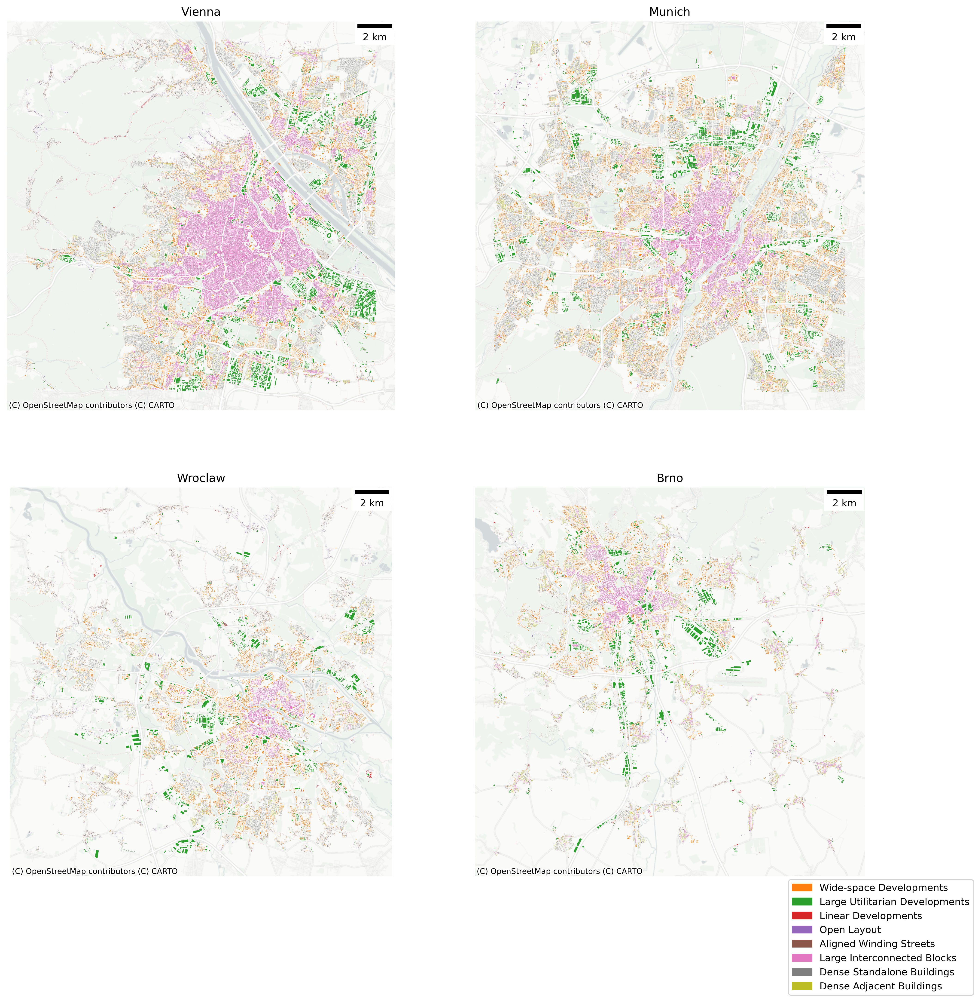

In [55]:
fig, ax = plt.subplots(2, 2, figsize=(16,16), dpi=300)

h1 = plot_predictions(vienna_buildings, ax[0][0], cmap, 'Vienna')
h2 = plot_predictions(munich_buildings, ax[0][1], cmap, 'Munich')
h3 = plot_predictions(wroclaw_buildings, ax[1][0], cmap, 'Wroclaw')
h4 = plot_predictions(brno_buildings, ax[1][1], cmap, 'Brno')

legend_patches = [mpatches.Patch(color=cmap[cluster], label=cluster_names[cluster]) for cluster in range(1, 9)]
fig.legend(handles=legend_patches, loc='lower right')

### Interactive plot for a specific region

In [225]:
plot_buildings = wroclaw_buildings

In [226]:
layer = SolidPolygonLayer.from_geopandas(
    gdf=plot_buildings, opacity=0.15
)

/home/krasen/morphometrics/.pixi/envs/default/lib/python3.12/site-packages/lonboard/_geoarrow/ops/reproject.py:97: UserWarning: Input being reprojected to EPSG:4326 CRS
  warnings.warn("Input being reprojected to EPSG:4326 CRS")


In [227]:
np.unique(plot_buildings['prediction'].values.astype(int))

array([ 1,  2,  5,  6,  7,  8,  9, 11, 12, 13, 14, 15, 16])

In [228]:
m = Map(layer, basemap_style=CartoBasemap.DarkMatter)

In [229]:
from sidecar import Sidecar
sc = Sidecar(title='buildings')
with sc:
    display(m)

In [230]:
final_colors = get_color(np.arange(0, 20))

In [231]:
layer.get_fill_color = final_colors[plot_buildings['prediction'].astype(int)]

In [171]:
layer.get_fill_color = final_colors[plot_buildings['accurate'].astype(int)]